### Library

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
pd.set_option('display.max_columns', None)
import matplotlib.ticker as ticker

from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, classification_report, precision_score, recall_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

from sklearn.ensemble import RandomForestRegressor

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras import regularizers
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.optimizers import SGD

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Setting up to run randomized search with GPU

In [ ]:
!nvidia-smi  # check GPU availability

/bin/bash: line 1: nvidia-smi: command not found


In [ ]:
# Install RAPIDS via conda (note the specific version for compatibility with the environment)
!pip install --upgrade setuptools
!conda install -c rapidsai -c nvidia -c conda-forge cuml=21.06 python=3.8 cudatoolkit=11.2 -y

/bin/bash: line 1: conda: command not found


### Load Data

In [ ]:
def load_data(path):
  df_original = pd.read_csv(path)
  df = df_original.copy()
  # change date column into datetime
  df['date'] = pd.to_datetime(df['date'])
  # set date as index
  df.set_index('date', inplace = True)
  # derive hour, month, day, and season
  df['hour']=df.index.hour
  df['month']=df.index.month
  df['day']=df.index.day
  df['season']=pd.cut(df.index.month, bins = [0,3,6,9,12], labels = ['winter', 'spring', 'summer', 'fall'])
  return df
  return df.info()

df = load_data('/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/cleaned_weather.csv')
df

,p,T,Tpot,Tdew,rh,VPmax,VPact,VPdef,sh,H2OC,rho,wv,max. wv,wd,rain,raining,SWDR,PAR,max. PAR,Tlog,hour,month,day,season
date,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:10:00,1008.89,0.71,273.18,-1.33,86.1,6.43,5.54,0.89,3.42,5.49,1280.62,1.02,1.60,224.3,0.0,0.0,0.0,0.0,0.0,11.45,0,1,1,winter
2020-01-01 00:20:00,1008.76,0.75,273.22,-1.44,85.2,6.45,5.49,0.95,3.39,5.45,1280.33,0.43,0.84,206.8,0.0,0.0,0.0,0.0,0.0,11.51,0,1,1,winter
2020-01-01 00:30:00,1008.66,0.73,273.21,-1.48,85.1,6.44,5.48,0.96,3.39,5.43,1280.29,0.61,1.48,197.1,0.0,0.0,0.0,0.0,0.0,11.60,0,1,1,winter
2020-01-01 00:40:00,1008.64,0.37,272.86,-1.64,86.3,6.27,5.41,0.86,3.35,5.37,1281.97,1.11,1.48,206.4,0.0,0.0,0.0,0.0,0.0,11.70,0,1,1,winter
2020-01-01 00:50:00,1008.61,0.33,272.82,-1.50,87.4,6.26,5.47,0.79,3.38,5.42,1282.08,0.49,1.40,209.6,0.0,0.0,0.0,0.0,0.0,11.81,0,1,1,winter
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 23:20:00,978.32,2.28,277.16,-0.80,80.0,7.20,5.76,1.44,3.67,5.89,1234.61,0.73,1.40,180.6,0.0,0.0,0.0,0.0,0.0,13.40,23,12,31,fall
2020-12-31 23:30:00,978.30,2.13,277.01,-0.43,83.1,7.12,5.92,1.20,3.77,6.05,1235.20,0.43,0.82,174.0,0.0,0.0,0.0,0.0,0.0,13.42,23,12,31,fall
2020-12-31 23:40:00,978.26,1.99,276.88,-0.71,82.2,7.05,5.80,1.26,3.69,5.93,1235.82,0.38,0.76,248.9,0.0,0.0,0.0,0.0,0.0,13.45,23,12,31,fall


Missing values note:
- wv : 1 row with -9999
- max PAR: 30 rows with -9999, replace with value of PAR after consulting the pairplot

In [ ]:
#replace minimum max. Par of -9999 with PAR values
df.loc[df['max. PAR'] == -9999, 'max. PAR'] = df.loc[df['max. PAR'] == -9999, 'PAR']

#replace minimum wv of -9999 with 0
df.loc[df['wv'] == -9999, 'wv'] = 0

#edit the name of column
df.rename(columns = {'max. PAR':'maxPAR'}, inplace = True)
df.rename(columns = {'max. wv':'maxwv'}, inplace = True)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52696 entries, 2020-01-01 00:10:00 to 2021-01-01 00:00:00
Data columns (total 24 columns):
 #   Column   Non-Null Count  Dtype   
---  ------   --------------  -----   
 0   p        52696 non-null  float64 
 1   T        52696 non-null  float64 
 2   Tpot     52696 non-null  float64 
 3   Tdew     52696 non-null  float64 
 4   rh       52696 non-null  float64 
 5   VPmax    52696 non-null  float64 
 6   VPact    52696 non-null  float64 
 7   VPdef    52696 non-null  float64 
 8   sh       52696 non-null  float64 
 9   H2OC     52696 non-null  float64 
 10  rho      52696 non-null  float64 
 11  wv       52696 non-null  float64 
 12  maxwv    52696 non-null  float64 
 13  wd       52696 non-null  float64 
 14  rain     52696 non-null  float64 
 15  raining  52696 non-null  float64 
 16  SWDR     52696 non-null  float64 
 17  PAR      52696 non-null  float64 
 18  maxPAR   52696 non-null  float64 
 19  Tlog     52696 non-null  float64

In [ ]:
df.describe()

,p,T,Tpot,Tdew,rh,VPmax,VPact,VPdef,sh,H2OC,rho,wv,maxwv,wd,rain,raining,SWDR,PAR,maxPAR,Tlog,hour,month,day
count,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000
mean,989.989233,10.818241,284.796938,5.409105,72.487133,14.487046,9.676828,4.810131,6.111159,9.782341,1210.882855,2.185684,3.632807,176.850276,0.011773,25.907469,131.331822,259.863438,315.166863,21.515206,11.500171,6.513891,15.754497
std,9.207149,7.468671,7.616995,5.956722,19.230260,7.632960,4.023504,5.539320,2.561536,4.082684,36.430222,1.601624,2.462467,81.194840,0.123289,111.503420,215.735116,422.786515,515.005250,7.790620,6.922783,3.451478,8.810597
min,955.580000,-6.440000,266.190000,-13.810000,21.160000,3.770000,2.090000,0.000000,1.300000,2.090000,1107.380000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.900000,0.000000,1.000000,1.000000
25%,984.800000,4.590000,278.550000,0.777500,58.820000,8.480000,6.460000,1.170000,4.070000,6.530000,1183.900000,1.000000,1.770000,141.100000,0.000000,0.000000,0.000000,0.000000,0.000000,15.240000,5.000000,4.000000,8.000000
50%,990.920000,10.230000,284.320000,5.260000,75.400000,12.480000,8.890000,2.740000,5.610000,8.990000,1210.800000,1.770000,3.000000,195.500000,0.000000,0.000000,2.820000,9.670000,13.320000,20.440000,12.000000,7.000000,16.000000
75%,995.930000,16.180000,290.260000,9.700000,87.900000,18.420000,12.050000,6.440000,7.620000,12.200000,1236.550000,2.920000,4.850000,226.700000,0.000000,0.000000,182.900000,366.437500,436.145000,26.822500,18.000000,10.000000,23.000000
max,1020.070000,34.800000,309.130000,20.500000,100.000000,55.670000,24.160000,42.100000,15.400000,24.530000,1318.520000,13.770000,22.900000,360.000000,11.200000,600.000000,1115.290000,2131.760000,2498.940000,49.090000,23.000000,12.000000,31.000000


In [ ]:
correlation = df.drop(['season', 'day'], axis=1).corr()
correlation

,p,T,Tpot,Tdew,rh,VPmax,VPact,VPdef,sh,H2OC,rho,wv,maxwv,wd,rain,raining,SWDR,PAR,maxPAR,Tlog,hour,month
p,1.000000,-0.127305,-0.223450,-0.207280,-0.068386,-0.098905,-0.183765,-0.002805,-0.200955,-0.201174,0.437434,-0.233252,-0.229759,-0.129084,-0.071890,-0.135033,0.073811,0.067915,0.048856,-0.082453,-0.014812,-0.154950
T,-0.127305,1.000000,0.995228,0.782740,-0.540784,0.967901,0.762860,0.779616,0.761550,0.761934,-0.946510,0.081629,0.109162,-0.061356,0.008448,-0.048777,0.448607,0.459806,0.457529,0.981562,0.193087,0.149844
Tpot,-0.223450,0.995228,1.000000,0.789478,-0.524880,0.961013,0.767773,0.766556,0.768193,0.768590,-0.973132,0.103414,0.130117,-0.047439,0.015404,-0.034742,0.433570,0.445155,0.444837,0.972736,0.191264,0.161709
Tdew,-0.207280,0.782740,0.789478,1.000000,0.087203,0.712665,0.977413,0.272064,0.976878,0.977256,-0.798148,-0.105629,-0.110783,0.022842,0.069465,0.094311,0.104446,0.117344,0.128169,0.741963,0.013741,0.344544
rh,-0.068386,-0.540784,-0.524880,0.087203,1.000000,-0.561612,0.085528,-0.836007,0.086812,0.086729,0.440074,-0.298028,-0.347825,0.115019,0.087426,0.228862,-0.558295,-0.558661,-0.546904,-0.558603,-0.295063,0.268277
VPmax,-0.098905,0.967901,0.961013,0.712665,-0.561612,1.000000,0.712554,0.860390,0.711273,0.711482,-0.900199,0.065238,0.095102,-0.068674,-0.001426,-0.062691,0.466474,0.478430,0.472586,0.962748,0.192277,0.143217
VPact,-0.183765,0.762860,0.767773,0.977413,0.085528,0.712554,1.000000,0.255506,0.999814,0.999816,-0.771779,-0.116831,-0.122343,0.013970,0.073675,0.089040,0.101192,0.113418,0.122064,0.727446,0.007999,0.308538
VPdef,-0.002805,0.779616,0.766556,0.272064,-0.836007,0.860390,0.255506,1.000000,0.253875,0.254162,-0.679846,0.174753,0.219911,-0.104771,-0.055481,-0.151059,0.569282,0.576877,0.562544,0.798241,0.259140,-0.026768
sh,-0.200955,0.761550,0.768193,0.976878,0.086812,0.711273,0.999814,0.253875,1.000000,0.999997,-0.776002,-0.112181,-0.117849,0.016267,0.075156,0.091335,0.099126,0.111392,0.120382,0.725602,0.008172,0.308783
H2OC,-0.201174,0.761934,0.768590,0.977256,0.086729,0.711482,0.999816,0.254162,0.999997,1.000000,-0.776427,-0.112093,-0.117755,0.016316,0.075122,0.091395,0.099238,0.111511,0.120519,0.725934,0.008212,0.309186


<Axes: >

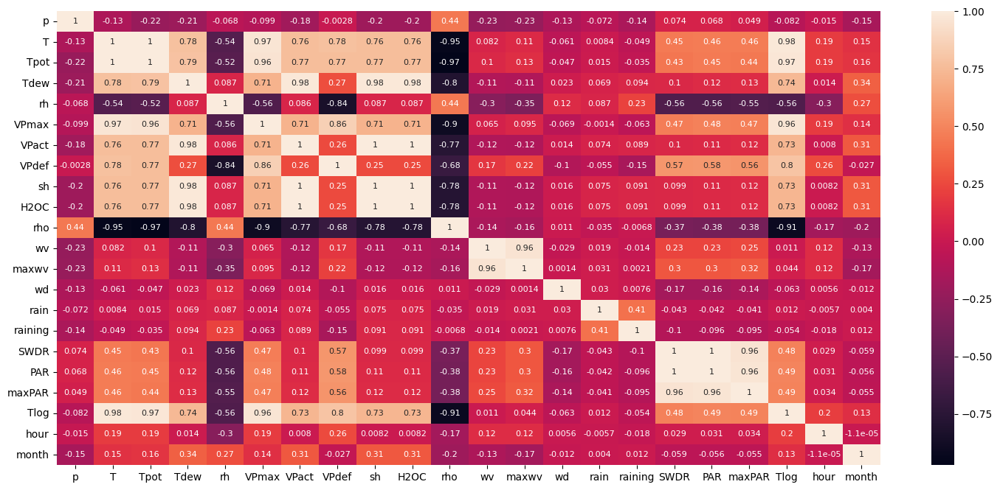

In [ ]:
# make pearson correlation with small annotation size
plt.figure(figsize=(18,8))
sns.heatmap(correlation, annot=True, annot_kws = {'size':8})

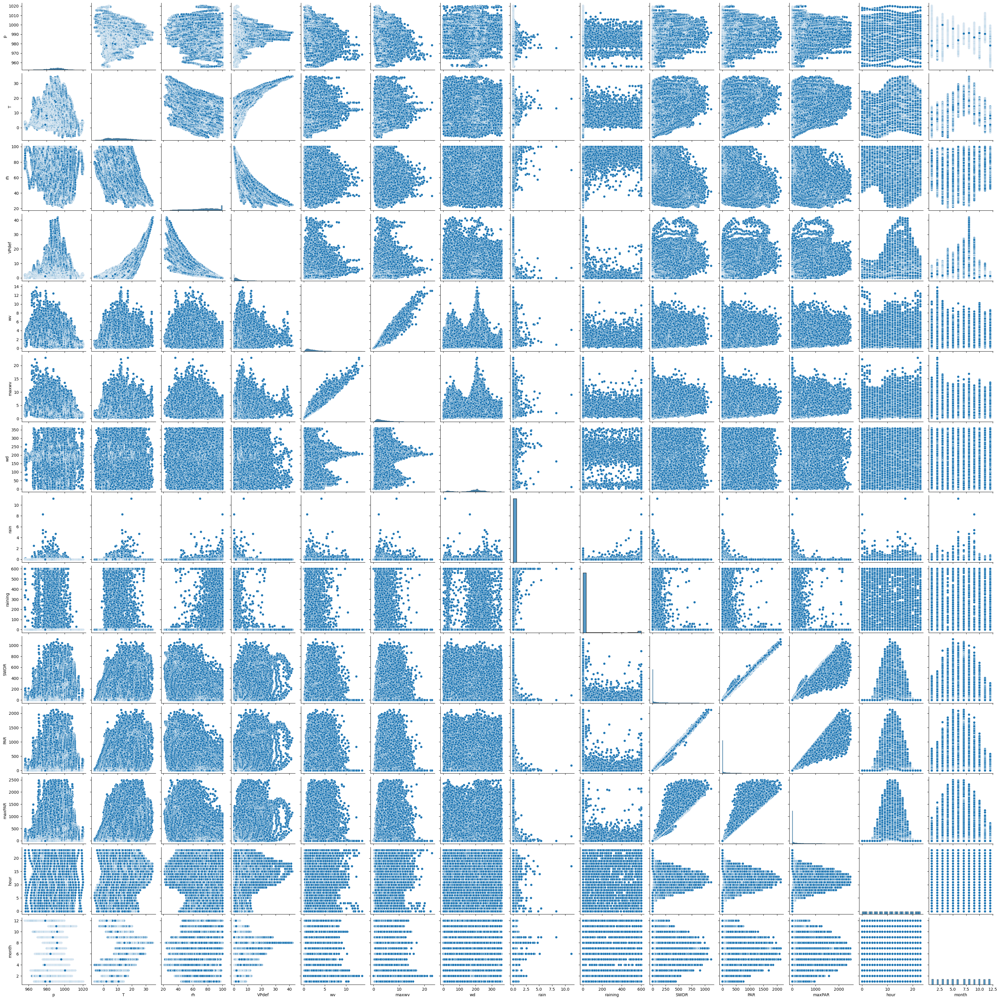

In [ ]:
# make pairplot
pairplot = df.drop(['season', 'day', 'Tpot', 'Tdew','sh', 'H2OC', 'VPmax', 'VPact', 'rho', 'Tlog'], axis=1)
sns.pairplot(pairplot)

### EDA

In [ ]:
#check daily statistics for T, Tdew, rh, wv, maxwv, wd, rain, SWDR, PAR, maxPAR
daily_stats = df.resample('D').agg({
    'T': ['mean', 'min', 'max'],
    'Tdew': ['mean'],
    'rh': ['mean'],
    'wv': ['mean'],
    'maxwv': ['mean'],
    'wd': ['median'],
    'rain': ['sum'],
    'SWDR': ['sum'],
    'PAR': ['sum'],
    'maxPAR': ['sum']
})
daily_stats.head()

T                  Tdew         rh        wv     maxwv  \
                mean   min   max      mean       mean      mean      mean   
date                                                                        
2020-01-01 -0.514196 -3.46  4.58 -2.569231  86.429301  0.783287  1.456573   
2020-01-02 -1.056319 -5.78  6.47 -4.215069  80.206042  1.173403  2.133542   
2020-01-03  4.835278  0.69  8.17  2.006806  81.975000  3.927153  6.106319   
2020-01-04  3.784931  1.47  6.61  0.785764  80.899861  2.261667  4.695347   
2020-01-05  2.735000  1.47  4.43 -1.018611  76.422639  1.791528  2.812431   

                wd rain     SWDR       PAR    maxPAR  
            median  sum      sum       sum       sum  
date                                                  
2020-01-01  181.40  0.0  8250.91  13710.98  14184.91  
2020-01-02  174.35  0.0  9570.44  13946.31  14439.75  
2020-01-03  196.60  0.3  1665.99   3622.40   4313.68  
2020-01-04  251.15  4.8  1157.79   2714.67   3110.59  
2020-01-05  225.10  0.0  4572.03   9396.10  11097.82

In [ ]:
# check extreme events
def analyze_extreme_events(df):
    """
    Identify and analyze extreme weather events
    """
    extremes = {
        'highest_temp': df['T'].max(),
        'lowest_temp': df['T'].min(),
        'hottest_day': df.resample('D')['T'].mean().idxmax(),
        'coldest_day': df.resample('D')['T'].mean().idxmin(),
        'max_daily_rain': df.resample('D')['rain'].sum().max(),
        'highest_wind': df['wv'].max(),
        'prevailing_wind_direction': df.groupby('wd')['wv'].count().idxmax(),
        'day_with_highest_wind_speed':df.resample('D')['wv'].max().idxmax(),
        'highest_radiation':df['SWDR'].max(),
        'max_daily_radiation': df.resample('D')['SWDR'].sum().max(),
        'day_with_highest_radiation': df.resample('D')['SWDR'].sum().idxmax(),

    }

    return extremes

# Extreme events
print("\nExtreme weather events:")
extremes = analyze_extreme_events(df)
for event, value in extremes.items():
    print(f"{event}: {value}")


Extreme weather events:
highest_temp: 34.8
lowest_temp: -6.44
hottest_day: 2020-08-08 00:00:00
coldest_day: 2020-01-25 00:00:00
max_daily_rain: 46.4
highest_wind: 13.77
prevailing_wind_direction: 210.3
day_with_highest_wind_speed: 2020-02-10 00:00:00
highest_radiation: 1115.29
max_daily_radiation: 49617.22
day_with_highest_radiation: 2020-06-01 00:00:00


In [ ]:
df.head()

,p,T,Tpot,Tdew,rh,VPmax,VPact,VPdef,sh,H2OC,rho,wv,maxwv,wd,rain,raining,SWDR,PAR,maxPAR,Tlog,hour,month,day,season
date,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:10:00,1008.89,0.71,273.18,-1.33,86.1,6.43,5.54,0.89,3.42,5.49,1280.62,1.02,1.60,224.3,0.0,0.0,0.0,0.0,0.0,11.45,0,1,1,winter
2020-01-01 00:20:00,1008.76,0.75,273.22,-1.44,85.2,6.45,5.49,0.95,3.39,5.45,1280.33,0.43,0.84,206.8,0.0,0.0,0.0,0.0,0.0,11.51,0,1,1,winter
2020-01-01 00:30:00,1008.66,0.73,273.21,-1.48,85.1,6.44,5.48,0.96,3.39,5.43,1280.29,0.61,1.48,197.1,0.0,0.0,0.0,0.0,0.0,11.60,0,1,1,winter
2020-01-01 00:40:00,1008.64,0.37,272.86,-1.64,86.3,6.27,5.41,0.86,3.35,5.37,1281.97,1.11,1.48,206.4,0.0,0.0,0.0,0.0,0.0,11.70,0,1,1,winter
2020-01-01 00:50:00,1008.61,0.33,272.82,-1.50,87.4,6.26,5.47,0.79,3.38,5.42,1282.08,0.49,1.40,209.6,0.0,0.0,0.0,0.0,0.0,11.81,0,1,1,winter


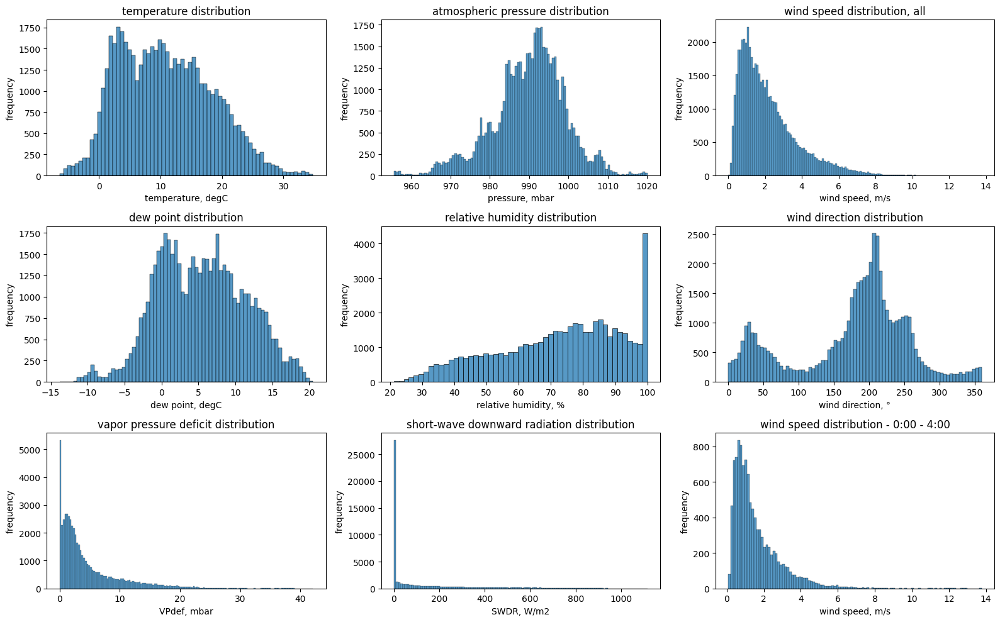

In [ ]:
fig, axes = plt.subplots(3, 3, figsize=(16,10))

#plot histogram
sns.histplot(df['T'], ax=axes[0,0])
axes[0,0].set_title("temperature distribution")
axes[0,0].set_xlabel("temperature, degC")
axes[0,0].set_ylabel("frequency")

sns.histplot(df['p'], ax=axes[0,1])
axes[0,1].set_title("atmospheric pressure distribution")
axes[0,1].set_xlabel("pressure, mbar")
axes[0,1].set_ylabel("frequency")

sns.histplot(df['wv'], ax=axes[0,2])
axes[0,2].set_title("wind speed distribution, all")
axes[0,2].set_xlabel("wind speed, m/s")
axes[0,2].set_ylabel("frequency")

#plot histogram the wv for hour between 0 and 4
sns.histplot(df.loc[df['hour'].between(0,4.5), 'wv'], ax=axes[2,2])
axes[2,2].set_title("wind speed distribution - 0:00 - 4:00")
axes[2,2].set_xlabel("wind speed, m/s")
axes[2,2].set_ylabel("frequency")

sns.histplot(df['Tdew'], ax=axes[1,0])
axes[1,0].set_title("dew point distribution")
axes[1,0].set_xlabel("dew point, degC")
axes[1,0].set_ylabel("frequency")

sns.histplot(df['rh'], ax=axes[1,1])
axes[1,1].set_title("relative humidity distribution")
axes[1,1].set_xlabel("relative humidity, %")
axes[1,1].set_ylabel("frequency")

sns.histplot(df['wd'], ax=axes[1,2])
axes[1,2].set_title("wind direction distribution")
axes[1,2].set_xlabel("wind direction, °")
axes[1,2].set_ylabel("frequency")

sns.histplot(df['VPdef'], ax=axes[2,0])
axes[2,0].set_title("vapor pressure deficit distribution")
axes[2,0].set_xlabel("VPdef, mbar")
axes[2,0].set_ylabel("frequency")

sns.histplot(df['SWDR'], ax=axes[2,1])
axes[2,1].set_title("short-wave downward radiation distribution")
axes[2,1].set_xlabel("SWDR, W/m2")
axes[2,1].set_ylabel("frequency")



plt.tight_layout()
plt.show()

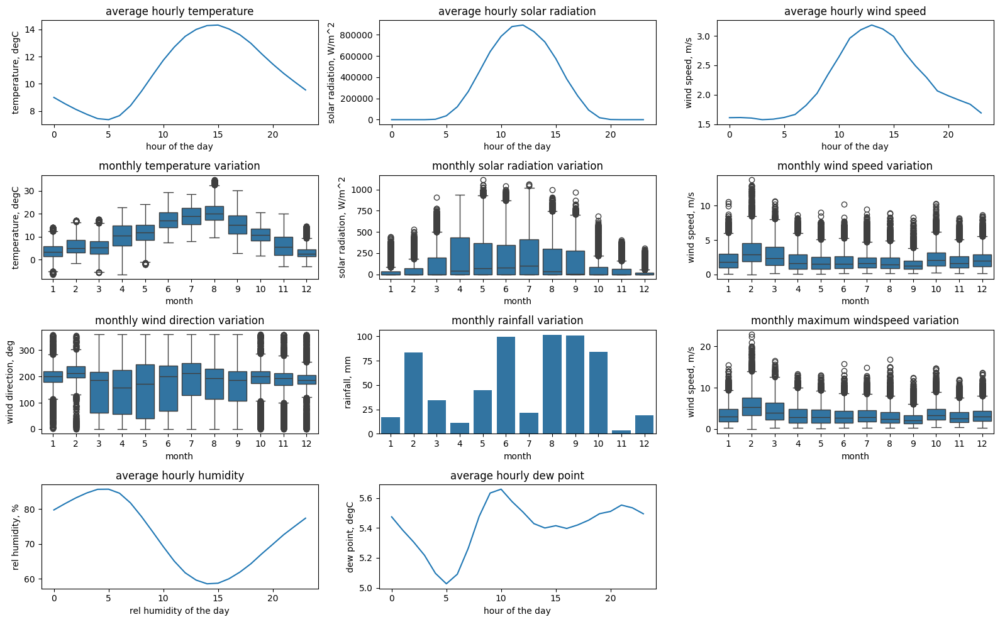

In [ ]:
fig, axes = plt.subplots(4, 3, figsize=(16,10))

#plot daily temperature pattern
hourly_T = df.groupby('hour')['T'].mean()
sns.lineplot(x=hourly_T.index, y=hourly_T.values, ax=axes[0,0])
axes[0,0].set_title("average hourly temperature")
axes[0,0].set_xlabel("hour of the day")
axes[0,0].set_ylabel("temperature, degC")

#plot daily radiation pattern
hourly_SWDR = df.groupby('hour')['SWDR'].sum()
sns.lineplot(x=hourly_SWDR.index, y=hourly_SWDR.values, ax=axes[0,1])
axes[0,1].set_title("average hourly solar radiation")
axes[0,1].set_xlabel("hour of the day")
axes[0,1].set_ylabel("solar radiation, W/m^2")

#plot daily wind speed
hourly_wv = df.groupby('hour')['wv'].mean()
sns.lineplot(x=hourly_wv.index, y=hourly_wv.values, ax=axes[0,2])
axes[0,2].set_title("average hourly wind speed")
axes[0,2].set_xlabel("hour of the day")
axes[0,2].set_ylabel("wind speed, m/s")

#plot monthly temperature variation
sns.boxplot(x='month', y='T', ax=axes[1,0], data=df)
axes[1,0].set_title("monthly temperature variation")
axes[1,0].set_xlabel("month")
axes[1,0].set_ylabel("temperature, degC")

#plot monthly radiation variation
sns.boxplot(x='month', y='SWDR', ax=axes[1,1], data=df)
axes[1,1].set_title("monthly solar radiation variation")
axes[1,1].set_xlabel("month")
axes[1,1].set_ylabel("solar radiation, W/m^2")

#plot monthly wind speed variation
sns.boxplot(x='month', y='wv', ax=axes[1,2], data=df)
axes[1,2].set_title("monthly wind speed variation")
axes[1,2].set_xlabel("month")
axes[1,2].set_ylabel("wind speed, m/s")

#plot monthly wind direction variation
sns.boxplot(x='month', y='wd', ax=axes[2,0], data=df)
axes[2,0].set_title("monthly wind direction variation")
axes[2,0].set_xlabel("month")
axes[2,0].set_ylabel("wind direction, deg")

#plot monthly rainfall
monthly_rain = df.groupby('month')['rain'].sum()
sns.barplot(x=monthly_rain.index, y=monthly_rain.values, ax=axes[2,1])
axes[2,1].set_title("monthly rainfall variation")
axes[2,1].set_xlabel("month")
axes[2,1].set_ylabel("rainfall, mm")

#plot monthly maximum windspeed
sns.boxplot(x='month', y='maxwv', ax=axes[2,2], data=df)
axes[2,2].set_title("monthly maximum windspeed variation")
axes[2,2].set_xlabel("month")
axes[2,2].set_ylabel("wind speed, m/s")

#plot daily humidity
hourly_rh = df.groupby('hour')['rh'].mean()
sns.lineplot(x=hourly_rh.index, y=hourly_rh.values, ax=axes[3,0])
axes[3,0].set_title("average hourly humidity")
axes[3,0].set_xlabel("rel humidity of the day")
axes[3,0].set_ylabel("rel humidity, %")

#plot daily dew point
hourly_Tdew = df.groupby('hour')['Tdew'].mean()
sns.lineplot(x=hourly_Tdew.index, y=hourly_Tdew.values, ax=axes[3,1])
axes[3,1].set_title("average hourly dew point")
axes[3,1].set_xlabel("hour of the day")
axes[3,1].set_ylabel("dew point, degC")

axes[3,2].set_visible(False)

plt.tight_layout()
plt.show()


- The highest average solar radiation (SWDR) and the highest average wind speed happen at similar hours of the day
- higher solar radiation during hotter months (April to August) as expected
- dominant wind direction records with more anomalies during colder months (October - December, January - February)
- desirable wind speed is above 5 m/s for wind farm, seems to indicate some potential through out the year, with highest wind speed recorded around January - February.
- according to the polar plot below, the wind speed > 5 m/s is also predominantly in the SSW direction, similar to majority of wind direction recorded.
- higher humidity is non ideal for solar panel efficiency, as more moisture affects sunlight absorption, and higher humidity cause higher temperature that reduce the efficiency of solar panel.
- dew point temperature, when crossed, means more condensation that can reduce the light transmission to solar panel.


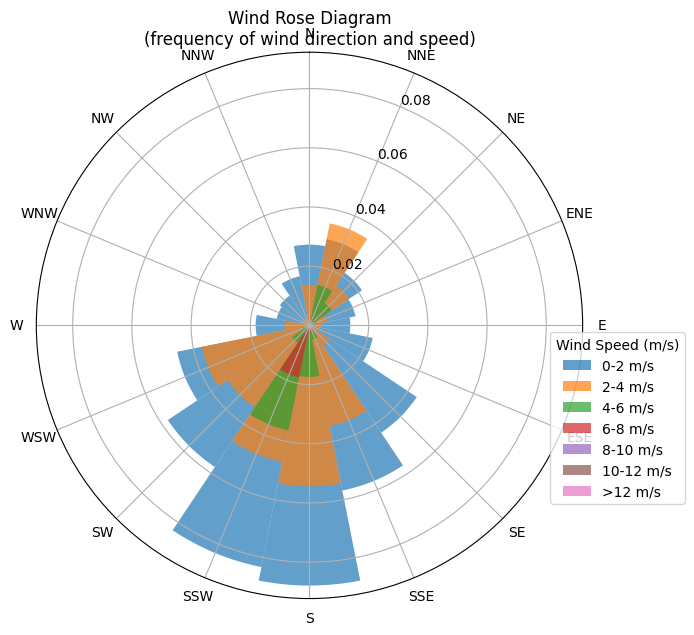

In [ ]:
# create a polar plot for wind speed and direction

#convert wind direction to radians
wd_rad = np.radians(df['wd'])
# Define wind speed bins
speed_bins = [0, 2, 4, 6, 8, 10, 12, np.inf]
speed_labels = ['0-2', '2-4','4-6', '6-8', '8-10','10-12', '>12']
# Create direction bins (16 compass directions)
dir_bins = np.linspace(0, 2*np.pi, 17)
dir_labels = ['N', 'NNE', 'NE', 'ENE', 'E', 'ESE', 'SE', 'SSE',
                 'S', 'SSW', 'SW', 'WSW', 'W', 'WNW', 'NW', 'NNW']
#categorize wind speeds
df['speed_cat'] = pd.cut(df['wv'], bins=speed_bins, labels=speed_labels)

fig = plt.figure(figsize=(7, 7))
ax = fig.add_subplot(111, projection='polar')

for speed_label in speed_labels:
  mask = df['speed_cat'] == speed_label
  if mask.any():
    hist, _ = np.histogram(wd_rad[mask], bins=dir_bins)
    hist = hist / len(df)  # Convert to frequency
    width = dir_bins[1] - dir_bins[0]
    plt.bar(dir_bins[:-1], hist, width=width, bottom=0.0,
           label=f'{speed_label} m/s', alpha=0.7)

ax.set_theta_direction(-1)
ax.set_theta_zero_location('N')
ax.set_thetagrids(np.degrees(dir_bins[:-1]), dir_labels)
ax.set_title('Wind Rose Diagram\n(frequency of wind direction and speed)')
ax.legend(title='Wind Speed (m/s)', bbox_to_anchor=(1.2, 0.5))

plt.tight_layout()
plt.show()


dominant wind direction is a crucial information for
- large scale evacuation scenarios (avoid the likely direction of wind).
- placement of wind turbin in the case of wind farm
- containment of vapor or spray in the agricultural process

### Prepare Data for Learning

In [ ]:
df.columns

Index(['p', 'T', 'Tpot', 'Tdew', 'rh', 'VPmax', 'VPact', 'VPdef', 'sh', 'H2OC',
       'rho', 'wv', 'maxwv', 'wd', 'rain', 'raining', 'SWDR', 'PAR', 'maxPAR',
       'Tlog', 'hour', 'month', 'day', 'season', 'speed_cat'],
      dtype='object')

In [ ]:
#extract the feature columns for modelling
df_rf = df.drop(['Tpot', 'VPmax', 'VPact', 'sh', 'H2OC',
       'PAR', 'maxPAR',
       'Tlog', 'maxwv', 'month', 'day'], axis=1)
df_rf

,p,T,Tdew,rh,VPdef,rho,wv,wd,rain,raining,SWDR,hour,season,speed_cat
date,,,,,,,,,,,,,,
2020-01-01 00:10:00,1008.89,0.71,-1.33,86.1,0.89,1280.62,1.02,224.3,0.0,0.0,0.0,0,winter,0-2
2020-01-01 00:20:00,1008.76,0.75,-1.44,85.2,0.95,1280.33,0.43,206.8,0.0,0.0,0.0,0,winter,0-2
2020-01-01 00:30:00,1008.66,0.73,-1.48,85.1,0.96,1280.29,0.61,197.1,0.0,0.0,0.0,0,winter,0-2
2020-01-01 00:40:00,1008.64,0.37,-1.64,86.3,0.86,1281.97,1.11,206.4,0.0,0.0,0.0,0,winter,0-2
2020-01-01 00:50:00,1008.61,0.33,-1.50,87.4,0.79,1282.08,0.49,209.6,0.0,0.0,0.0,0,winter,0-2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-12-31 23:20:00,978.32,2.28,-0.80,80.0,1.44,1234.61,0.73,180.6,0.0,0.0,0.0,23,fall,0-2
2020-12-31 23:30:00,978.30,2.13,-0.43,83.1,1.20,1235.20,0.43,174.0,0.0,0.0,0.0,23,fall,0-2
2020-12-31 23:40:00,978.26,1.99,-0.71,82.2,1.26,1235.82,0.38,248.9,0.0,0.0,0.0,23,fall,0-2


In [ ]:
df_rf['season'].unique(), df['speed_cat'].unique()

(['winter', 'spring', 'summer', 'fall']
 Categories (4, object): ['winter' < 'spring' < 'summer' < 'fall'],
 ['0-2', '2-4', '4-6', '6-8', '8-10', '10-12', '>12', NaN]
 Categories (7, object): ['0-2' < '2-4' < '4-6' < '6-8' < '8-10' < '10-12' < '>12'])

In [ ]:
# map the object data to numeric
df_rf['season'] = df_rf['season'].map({'winter': 0, 'spring': 1, 'summer': 2, 'fall': 3})
df_rf['speed_cat']= df_rf['speed_cat'].map({'0-2': 0, '2-4': 1, '4-6': 2, '6-8': 3, '8-10': 4, '10-12': 5, '>12': 6})

#find the NaN rows in speed_cat
df_rf[df_rf['speed_cat'].isna()]

#replace the NaN rows in speed_cat with zero
df_rf['speed_cat'].fillna(0, inplace=True)

df_rf['season'].unique(), df_rf['speed_cat'].unique()

([0, 1, 2, 3]
 Categories (4, int64): [0 < 1 < 2 < 3],
 [0, 1, 2, 3, 4, 5, 6]
 Categories (7, int64): [0 < 1 < 2 < 3 < 4 < 5 < 6])

In [ ]:
df_rf.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52696 entries, 2020-01-01 00:10:00 to 2021-01-01 00:00:00
Data columns (total 24 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   p             52696 non-null  float64 
 1   T             52696 non-null  float64 
 2   Tdew          52696 non-null  float64 
 3   rh            52696 non-null  float64 
 4   VPdef         52696 non-null  float64 
 5   rho           52696 non-null  float64 
 6   wv            52696 non-null  float64 
 7   wd            52696 non-null  float64 
 8   rain          52696 non-null  float64 
 9   raining       52696 non-null  float64 
 10  SWDR          52696 non-null  float64 
 11  hour          52696 non-null  int32   
 12  season        52696 non-null  category
 13  speed_cat     52696 non-null  category
 14  wd_sin        52696 non-null  float64 
 15  wd_cos        52696 non-null  float64 
 16  T_Tdew        52696 non-null  float64 
 17  rh_T          5

### features engineering for random forest regression

In [ ]:
# compute the sin and cosine of wd (wind direction)
df_rf['wd_sin'] = np.sin(np.radians(df_rf['wd']))
df_rf['wd_cos'] = np.cos(np.radians(df_rf['wd']))

# compute wind pressure interaction with p * wv ==> removing this as it's masking the rest of the features
#df_rf['wv_p'] = df_rf['wv'] * df_rf['p']

# compute difference betweeen air temperature and dew point temperature
df_rf['T_Tdew'] = df_rf['T'] - df_rf['Tdew']

# compute relative humidity and temperature interaction
df_rf['rh_T'] = df_rf['rh'] * df_rf['T']

# compute vapor pressure deficit interaction with Temperature and relative humidity
df_rf['VPdef_T'] = np.where(df_rf['T'] != 0, df_rf['VPdef'] / df_rf['T'], 0)
df_rf['VPdef_rh'] = df_rf['VPdef'] * df_rf['rh']

# Create a new column for rainfall over the last 1 hour (last 6 rows)
df_rf['rainfall_1hr'] = np.array([np.sum(df['rain'].values[i-6:i]) if i >= 6 else 0 for i in range(len(df))])
df_rf['rainfall_1hr'] = df_rf['rainfall_1hr'].astype(float)

# compute rain intensity as rain (mm) * raining (s)
df_rf['rain_int'] = df_rf['rain'] * df_rf['raining']

#compute short-wave downward radiation interaction with temperature
df_rf['SWDR_T'] = df_rf['SWDR'] * df_rf['T']

#compute air density interaction with wind speed ==> removing this as it's masking the rest of the features
#df_rf['rho_wv'] = df_rf['rho'] * df_rf['wv']

#compute air density interaction with temperature
df_rf['rho_T'] = df_rf['rho'] * df_rf['T']

In [ ]:
df_rf.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 52696 entries, 2020-01-01 00:10:00 to 2021-01-01 00:00:00
Data columns (total 24 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   p             52696 non-null  float64 
 1   T             52696 non-null  float64 
 2   Tdew          52696 non-null  float64 
 3   rh            52696 non-null  float64 
 4   VPdef         52696 non-null  float64 
 5   rho           52696 non-null  float64 
 6   wv            52696 non-null  float64 
 7   wd            52696 non-null  float64 
 8   rain          52696 non-null  float64 
 9   raining       52696 non-null  float64 
 10  SWDR          52696 non-null  float64 
 11  hour          52696 non-null  int32   
 12  season        52696 non-null  category
 13  speed_cat     52696 non-null  category
 14  wd_sin        52696 non-null  float64 
 15  wd_cos        52696 non-null  float64 
 16  T_Tdew        52696 non-null  float64 
 17  rh_T          5

In [ ]:
df_rf.head(8)

,p,T,Tdew,rh,VPdef,rho,wv,wd,rain,raining,SWDR,hour,season,speed_cat,wd_sin,wd_cos,wv_p,T_Tdew,rh_T,VPdef_T,VPdef_rh,rainfall_1hr,rain_int,SWDR_T,rho_wv,rho_T
date,,,,,,,,,,,,,,,,,,,,,,,,,,
2020-01-01 00:10:00,1008.89,0.71,-1.33,86.1,0.89,1280.62,1.02,224.3,0.0,0.0,0.0,0,0,0,-0.698415,-0.715693,1029.0678,2.04,61.131,1.253521,76.629,0.0,0.0,0.0,1306.2324,909.2402
2020-01-01 00:20:00,1008.76,0.75,-1.44,85.2,0.95,1280.33,0.43,206.8,0.0,0.0,0.0,0,0,0,-0.450878,-0.892586,433.7668,2.19,63.900,1.266667,80.940,0.0,0.0,0.0,550.5419,960.2475
2020-01-01 00:30:00,1008.66,0.73,-1.48,85.1,0.96,1280.29,0.61,197.1,0.0,0.0,0.0,0,0,0,-0.294040,-0.955793,615.2826,2.21,62.123,1.315068,81.696,0.0,0.0,0.0,780.9769,934.6117
2020-01-01 00:40:00,1008.64,0.37,-1.64,86.3,0.86,1281.97,1.11,206.4,0.0,0.0,0.0,0,0,0,-0.444635,-0.895712,1119.5904,2.01,31.931,2.324324,74.218,0.0,0.0,0.0,1422.9867,474.3289
2020-01-01 00:50:00,1008.61,0.33,-1.50,87.4,0.79,1282.08,0.49,209.6,0.0,0.0,0.0,0,0,0,-0.493942,-0.869495,494.2189,1.83,28.842,2.393939,69.046,0.0,0.0,0.0,628.2192,423.0864
2020-01-01 01:00:00,1008.44,0.34,-1.54,87.1,0.81,1281.84,0.63,188.0,0.0,0.0,0.0,1,0,0,-0.139173,-0.990268,635.3172,1.88,29.614,2.382353,70.551,0.0,0.0,0.0,807.5592,435.8256
2020-01-01 01:10:00,1008.49,0.19,-1.65,87.4,0.78,1282.63,0.88,195.4,0.0,0.0,0.0,1,0,0,-0.265556,-0.964095,887.4712,1.84,16.606,4.105263,68.172,0.0,0.0,0.0,1128.7144,243.6997
2020-01-01 01:20:00,1008.40,0.03,-1.70,88.1,0.73,1283.30,1.05,183.1,0.0,0.0,0.0,1,0,0,-0.054079,-0.998537,1058.8200,1.73,2.643,24.333333,64.313,0.0,0.0,0.0,1347.4650,38.4990


In [ ]:
df_rf.describe()

,p,T,Tdew,rh,VPdef,rho,wv,wd,rain,raining,SWDR,hour,wd_sin,wd_cos,T_Tdew,rh_T,VPdef_T,VPdef_rh,rainfall_1hr,rain_int,SWDR_T,rho_T
count,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000,52696.000000
mean,989.989233,10.818241,5.409105,72.487133,4.810131,1210.882855,2.185684,176.850276,0.011773,25.907469,131.331822,11.500171,-0.146200,-0.365000,5.409136,706.514976,0.409019,259.620678,0.070639,5.931342,2143.585141,12842.095563
std,9.207149,7.468671,5.956722,19.230260,5.539320,36.430222,1.601624,81.194840,0.123289,111.503420,215.735116,6.922783,0.606501,0.691066,4.649434,456.117419,3.192753,215.969893,0.560826,69.459962,4321.369869,8613.483749
min,955.580000,-6.440000,-13.810000,21.160000,0.000000,1107.380000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-1.000000,-0.010000,-597.632000,-314.000000,0.000000,0.000000,0.000000,-1082.421000,-8458.553600
25%,984.800000,4.590000,0.777500,58.820000,1.170000,1183.900000,1.000000,141.100000,0.000000,0.000000,0.000000,5.000000,-0.654741,-0.929776,1.870000,343.979750,0.168643,100.360500,0.000000,0.000000,0.000000,5681.812450
50%,990.920000,10.230000,5.260000,75.400000,2.740000,1210.800000,1.770000,195.500000,0.000000,0.000000,2.820000,12.000000,-0.236838,-0.709571,4.120000,711.489000,0.369861,198.529500,0.000000,0.000000,5.536550,12402.008550
75%,995.930000,16.180000,9.700000,87.900000,6.440000,1236.550000,2.920000,226.700000,0.000000,0.000000,182.900000,18.000000,0.384295,0.137445,7.870000,1016.203300,0.595533,374.867475,0.000000,0.000000,1931.285375,19179.900150
max,1020.070000,34.800000,20.500000,100.000000,42.100000,1318.520000,13.770000,360.000000,11.200000,600.000000,1115.290000,23.000000,1.000000,1.000000,23.520000,2005.692000,224.000000,1145.384400,28.300000,6720.000000,28800.145200,38853.156000


In [ ]:
df_rf.columns

Index(['p', 'T', 'Tdew', 'rh', 'VPdef', 'rho', 'wv', 'wd', 'rain', 'raining',
       'SWDR', 'hour', 'season', 'speed_cat', 'wd_sin', 'wd_cos', 'T_Tdew',
       'rh_T', 'VPdef_T', 'VPdef_rh', 'rainfall_1hr', 'rain_int', 'SWDR_T',
       'rho_T'],
      dtype='object')

In [ ]:
#write df_rf to csv
df_rf.to_csv('df_rf.csv', index=False)

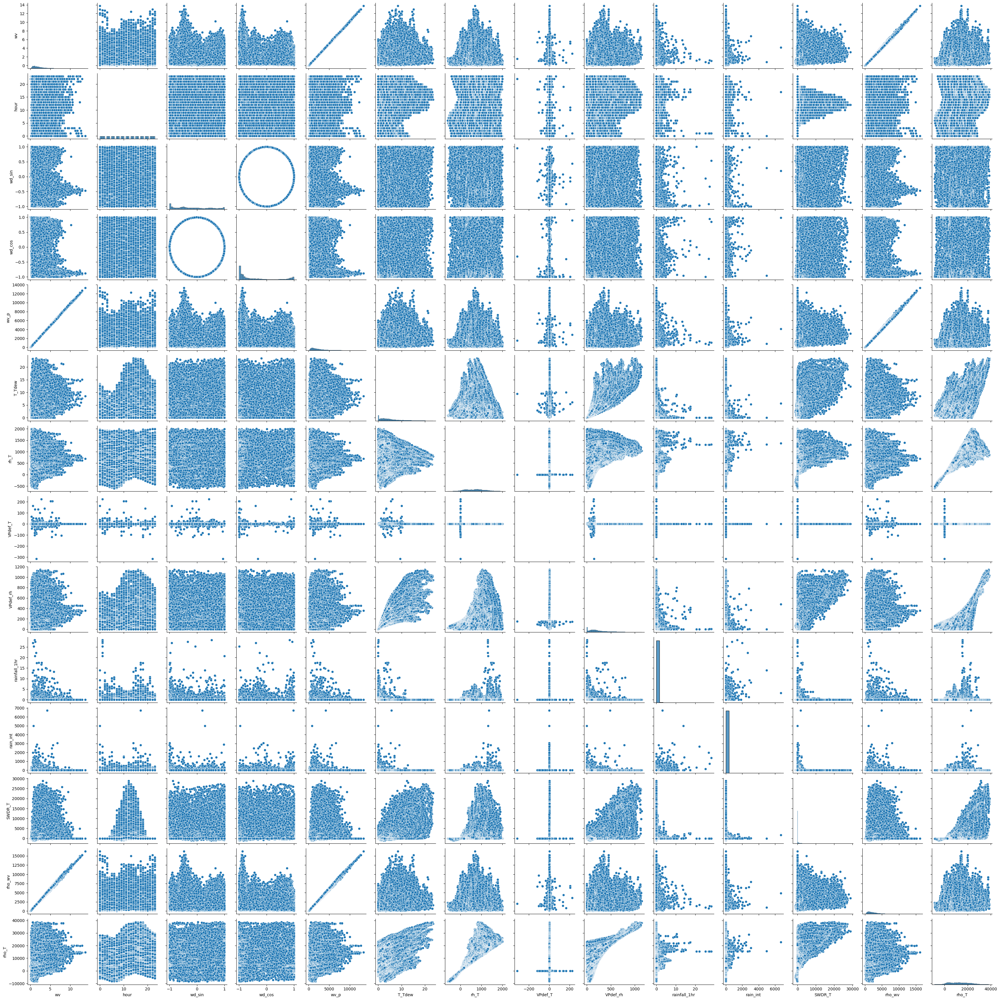

In [ ]:
# make pairplot of the newly created features
pairplot_features_eng = df_rf.drop(['p', 'T', 'Tdew', 'rh', 'VPdef', 'rho', 'wd', 'rain', 'raining',
       'SWDR'], axis=1).reset_index(drop=True)
sns.pairplot(pairplot_features_eng)

### Preparation for random forest regression

In [ ]:
#features and target for random forest regression
X_rf = df_rf.drop(['wv', 'speed_cat', 'wd'], axis=1)
y_rf = df_rf['wv']

In [ ]:
type(X_rf) # pandas array

pandas.core.frame.DataFrame

In [ ]:
type(y_rf) # pandas series

pandas.core.series.Series

In [ ]:
# split train test data
X_train_rf, X_test_rf, y_train_rf, y_test_rf = train_test_split(X_rf, y_rf, test_size=0.2, random_state=42)
X_train_rf.shape, X_test_rf.shape, y_train_rf.shape, y_test_rf.shape

((42156, 21), (10540, 21), (42156,), (10540,))

In [ ]:
type(X_train_rf) # pandas array

pandas.core.frame.DataFrame

In [ ]:
type(y_train_rf) # pandas series

pandas.core.series.Series

### Define random forest model

In [ ]:
# Initiate model with random_state = 42.
rf = RandomForestRegressor(random_state=42)

# Fit the model
rf.fit(X_train_rf, y_train_rf)

RandomForestRegressor(random_state=42)

### Make prediction, evaluate, and find features importance

In [ ]:
# Make prediction
y_pred_rf = rf.predict(X_test_rf)

In [ ]:
# evaluate base model
def evaluate_model(y_test, y_pred):
    """
    Evaluate
    """
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    return mae, mse, rmse, r2

mae, mse, rmse, r2 = evaluate_model(y_test_rf, y_pred_rf)

In [ ]:
print(f'MAE base: {mae:.6f}')
print(f'MSE base: {mse:.6f}')
print(f'RMSE base: {rmse:.6f}')
print(f'R2 base: {r2:.6f}')

MAE base: 0.447594
MSE base: 0.397680
RMSE base: 0.630619
R2 base: 0.839969


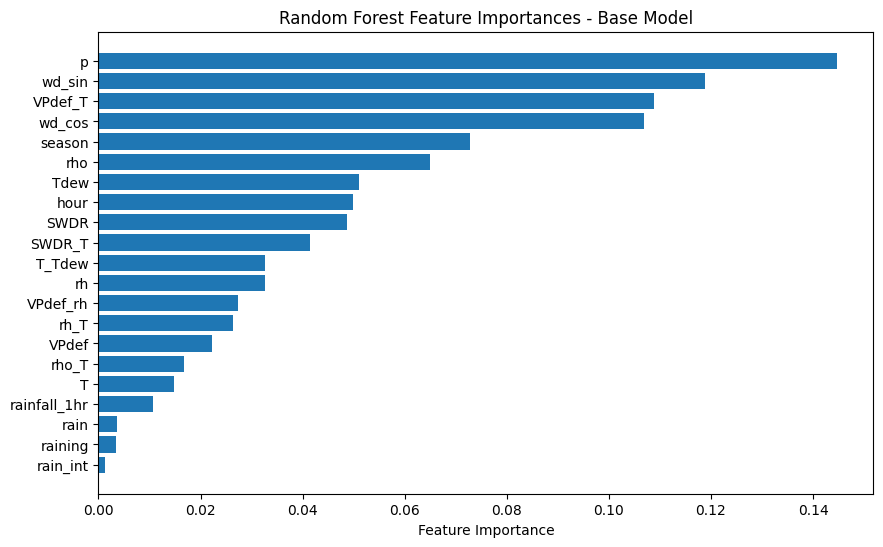

In [ ]:
# Extract feature importances from the trained model
feature_importances = rf.feature_importances_

# Sort the feature importances in descending order
sorted_idx = np.argsort(feature_importances)[::-1]

# Create a bar plot of feature importances
plt.figure(figsize=(10, 6))
plt.barh(X_rf.columns[sorted_idx], feature_importances[sorted_idx])
plt.xlabel('Feature Importance')
plt.title('Random Forest Feature Importances - Base Model')
plt.gca().invert_yaxis()  # To display the most important feature at the top
plt.show()


### hyperparameters optimization

In [ ]:
# parameters list to optimize
param_grid = {
    'n_estimators': [50,100, 150], # A larger number of trees generally improves the model's performance, but it also increases computation time
    'max_depth': [30, 40, 50], #Smaller values help to prevent overfitting
    'min_samples_split': [2, 5, 10], # Larger values help control overfitting by requiring more samples to split a node
    'min_samples_leaf': [1, 2] #Increasing this value can reduce overfitting by making the leaf nodes more general
}

n_iter = 50
scoring = 'r2'
cv = 5

In [ ]:
#randomized search
random_search = RandomizedSearchCV(
    estimator=rf,
    param_distributions=param_grid,
    n_iter=n_iter,
    scoring=scoring,
    cv=cv,
    verbose=2,
    random_state=42,
    n_jobs=-1
)

In [ ]:
#fit the randomized search to training data # 45 minutes
random_search.fit(X_train_rf, y_train_rf)

Fitting 5 folds for each of 50 candidates, totalling 250 fits


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_iter=50, n_jobs=-1,
                   param_distributions={'max_depth': [30, 40, 50],
                                        'min_samples_leaf': [1, 2],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 150]},
                   random_state=42, scoring='r2', verbose=2)

In [ ]:
# Output the best parameters and the corresponding score
print("Best parameters found: ", random_search.best_params_)
print("Best score (r2) found: ", random_search.best_score_)

Best parameters found:  {'n_estimators': 150, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': 30}
Best score (r2) found:  0.8276724543499536


In [ ]:
random_search.best_estimator_  # min samples split and min samples leaf are at default setting

RandomForestRegressor(max_depth=30, n_estimators=150, random_state=42)

In [ ]:
#using the best estimator in the rf model
rf_best = RandomForestRegressor(n_estimators=150, max_depth=30, random_state=42)
rf_best.fit(X_train_rf, y_train_rf)

RandomForestRegressor(max_depth=30, n_estimators=150, random_state=42)

In [ ]:
# Make prediction
y_pred_rf_best = rf_best.predict(X_test_rf)

In [ ]:
# evaluate best model
def evaluate_model(y_test, y_pred):
    """
    Evaluate
    """
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    return mae, mse, rmse, r2

mae, mse, rmse, r2 = evaluate_model(y_test_rf, y_pred_rf_best)

In [ ]:
print(f'MAE best: {mae:.6f}')
print(f'MSE best: {mse:.6f}')
print(f'RMSE best: {rmse:.6f}')
print(f'R2 best: {r2:.6f}')

MAE best: 0.447346
MSE best: 0.396700
RMSE best: 0.629841
R2 best: 0.840363


In [ ]:
# Extract feature importances from the best model
feature_importances_best = rf_best.feature_importances_

# Sort the feature importances in descending order
sorted_idx_best = np.argsort(feature_importances_best)[::-1]

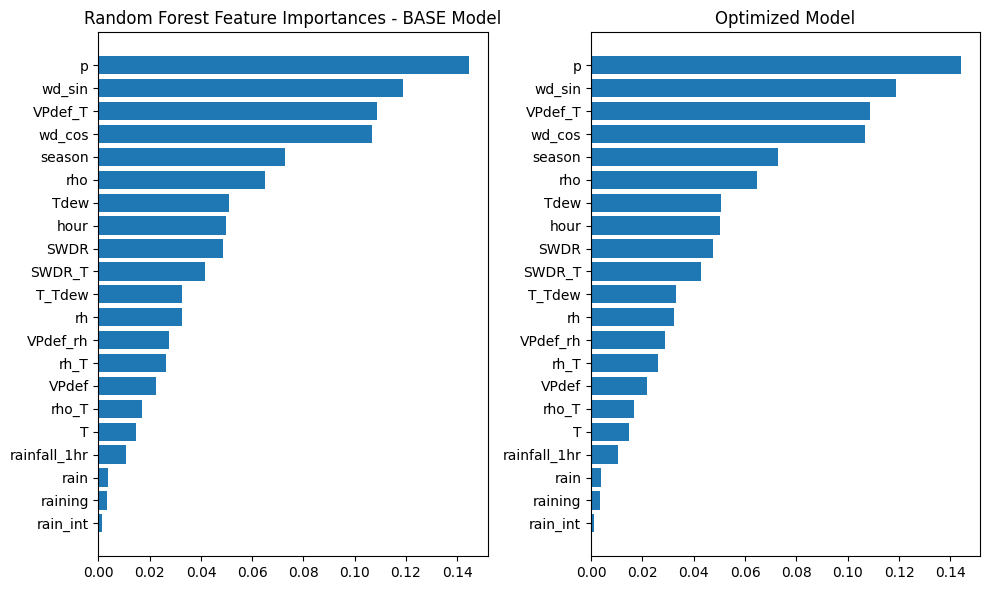

In [ ]:
# Create a bar plot of feature importances
fig, axes = plt.subplots(1, 2, figsize=(10,6))

axes[1].barh(X_rf.columns[sorted_idx_best], feature_importances_best[sorted_idx_best])
axes[1].set_title('Optimized Model')
axes[1].invert_yaxis()  # To display the most important feature at the top

axes[0].barh(X_rf.columns[sorted_idx], feature_importances[sorted_idx])
axes[0].set_title('Random Forest Feature Importances - BASE Model')
axes[0].invert_yaxis()  # To display the most important feature at the top

plt.tight_layout()
plt.show()

### Save the optimized model

In [ ]:
import joblib

In [ ]:
joblib.dump(rf_best, 'rf_best.joblib')

['rf_best.joblib']

In [ ]:
joblib.dump(rf_best, '/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/rf_best.joblib')

['/content/drive/MyDrive/Colab_Notebooks/Capstone/weather/rf_best.joblib']

In [ ]:
# Load the saved model
loaded_best_model = joblib.load('rf_best.joblib')

# Use the loaded model to make predictions
y_pred_loaded_model = loaded_best_model.predict(X_test_rf)

In [ ]:
mae_loaded, mse_loaded, rmse_loaded, r2_loaded = evaluate_model(y_test_rf, y_pred_loaded_model)

print(f'MAE best: {mae_loaded:.6f}')
print(f'MSE best: {mse_loaded:.6f}')
print(f'RMSE best: {rmse_loaded:.6f}')
print(f'R2 best: {r2_loaded:.6f}')

MAE best: 0.447346
MSE best: 0.396700
RMSE best: 0.629841
R2 best: 0.840363
